In [1]:
!git clone https://github.com/shubham1810/DynamicRegionMerging.git

Cloning into 'DynamicRegionMerging'...
remote: Enumerating objects: 220, done.
remote: Counting objects: 100% (220/220), done.
remote: Compressing objects: 100% (125/125), done.
remote: Total 220 (delta 89), reused 220 (delta 89), pack-reused 0 (from 0)
Receiving objects: 100% (220/220), 36.58 MiB | 22.18 MiB/s, done.
Resolving deltas: 100% (89/89), done.


In [2]:
from skimage import data, segmentation

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import cv2

import os
import skimage.io as sio
import tqdm
import datetime
import copy
import shutil 

In [3]:
shutil.copyfile('/kaggle/input/rag-dt/rag.py', '/kaggle/working/DynamicRegionMerging/src/rag.py')

'/kaggle/working/DynamicRegionMerging/src/rag.py'

In [4]:
path = '/kaggle/input/onera-satellite-change-detection-dataset/images/Onera Satellite Change Detection dataset - Images/abudhabi/pair/'
img = cv2.imread(path + 'img1.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
w, h = int(img.shape[0]), int(img.shape[1])
img = cv2.resize(img, (h, w))

# labels = segmentation.slic(img, compactness=10, n_segments=500, start_label=1)
# labels = segmentation.slic(img, compactness=10, n_segments=500, start_label=1)
print(img.shape)

(799, 785, 3)


In [5]:
os.chdir('/kaggle/working/DynamicRegionMerging')

In [6]:
print(os.getcwd())

/kaggle/working/DynamicRegionMerging


In [7]:
from src.segment.watershed import watershed_segmentation

In [8]:
labels = watershed_segmentation(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY))
# labels = segmentation.slic(img, compactness=10, n_segments=300, start_label=1)

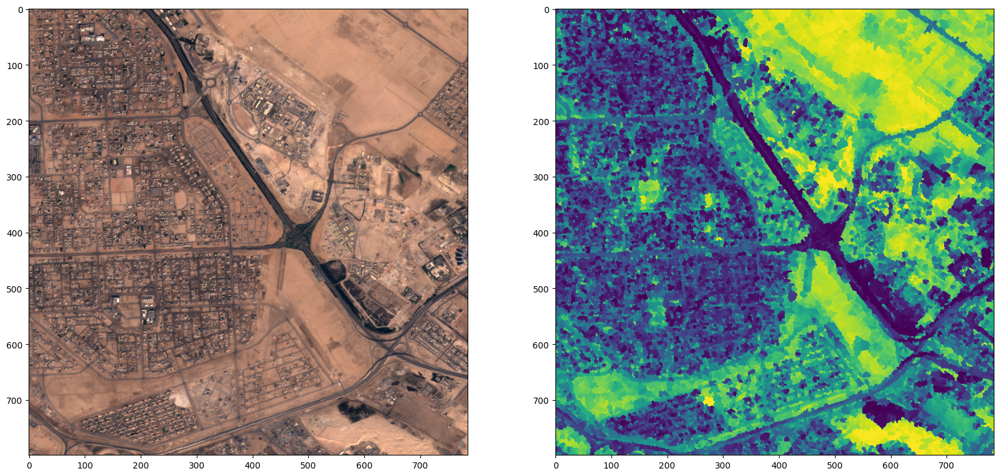

In [9]:
plt.figure(0, figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(img)

plt.subplot(1, 2, 2)
plt.imshow(labels)


plt.show()

In [10]:
len(np.unique(labels))

30803

In [11]:
from src.rag import RAG
from src.nng import NNG
from src.utils import visualize_rag, quantize_image, visualize_nng

In [12]:
from src.sprt import compute_averageColor, compute_conditionalProbability, compute_averageColor, sample_from_region, sprt_test

In [13]:
from src.region_merging import RegionMerging, NNGRegionMerging

In [14]:
import time

0:00:09.399882
Number of initial regions:  30803


100%|██████████| 100/100 [14:49<00:00,  8.90s/it]


Number of final regions:  1691
892.8348913192749


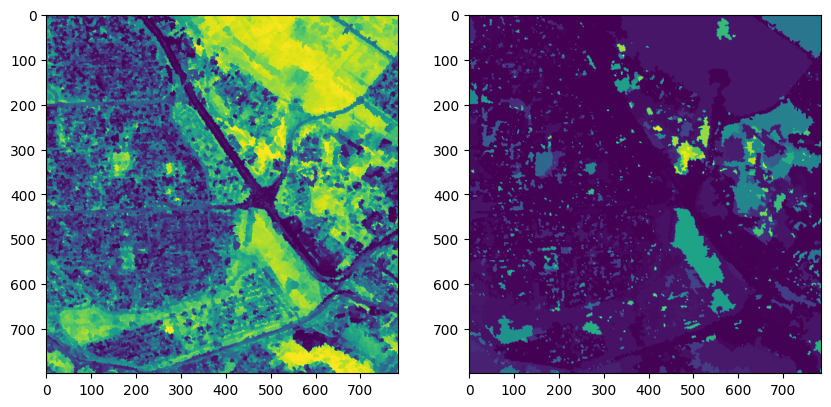

In [15]:
drm = NNGRegionMerging(img, labels, lambda1=0.9, lambda2=0.1)
start = time.time()
# start = datetime.datetime.now()
initial_labels = drm.get_labels()
initial_graph = copy.deepcopy(drm.graph)
initial_nng_graph = copy.deepcopy(drm.nng)
print("Number of initial regions: ", len(drm.graph.nodes))

drm.run_region_merging(100)

new_labels = drm.get_labels()
print("Number of final regions: ", len(drm.graph.nodes))
# print(datetime.datetime.now() - start)
end = time.time()
print(end-start)


# Visualize
plt.figure(0, figsize=(10, 7))
plt.subplot(1, 2, 1)
plt.imshow(initial_labels)
plt.subplot(1, 2, 2)
plt.imshow(new_labels)
plt.show()

In [16]:
from src.utils import visualize_nng, visualize_rag
save_path = '/kaggle/working/DynamicRegionMerging'

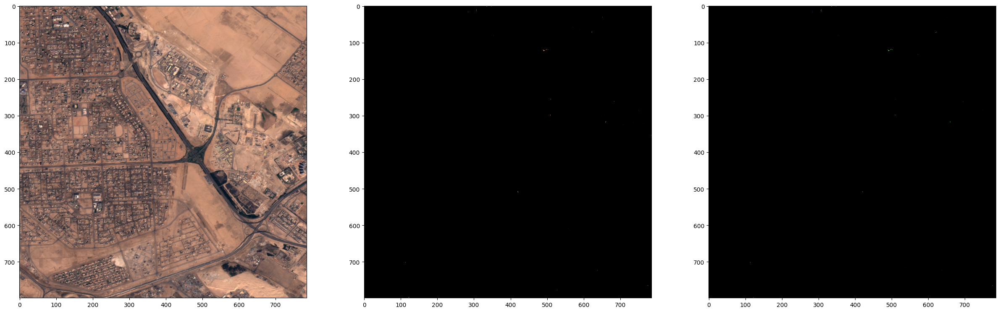

In [17]:
im1 = visualize_rag(img, initial_labels, initial_graph, method = 'rag', time = 'initial', path = save_path)

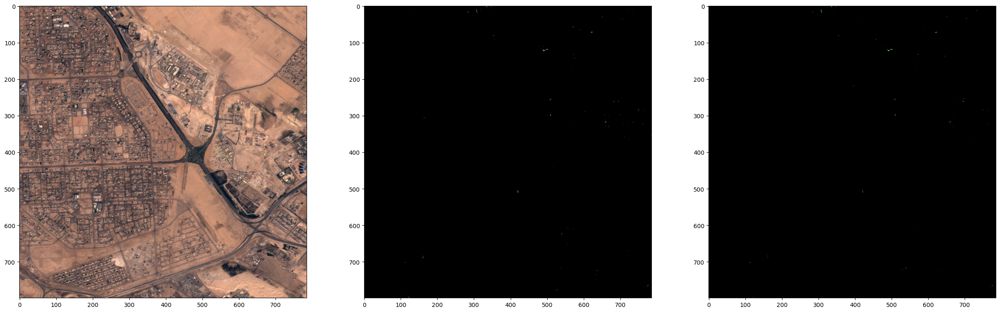

In [18]:
i = visualize_nng(img, initial_labels, initial_nng_graph, method = 'nng', time = 'initial', path = save_path)

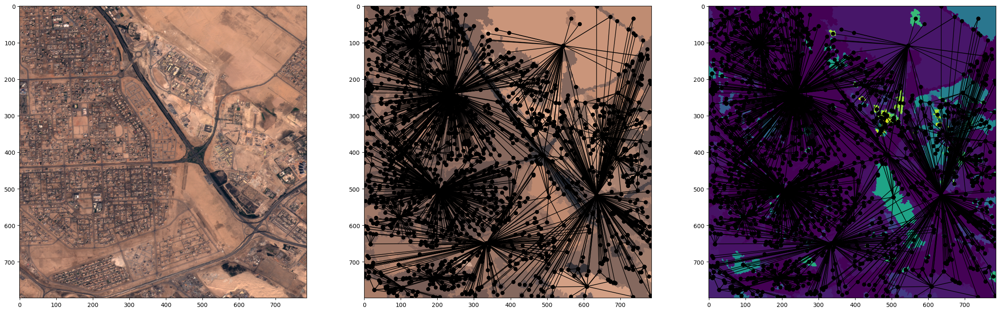

In [19]:
im2 = visualize_rag(img, new_labels, drm.graph, method = 'rag', time = 'final', path = save_path)

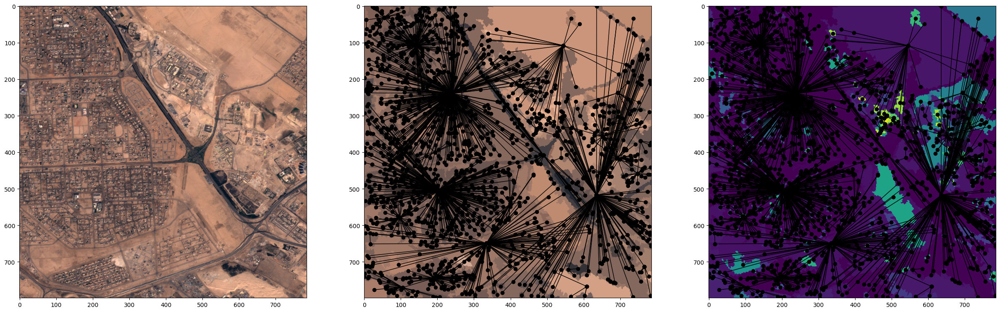

In [20]:
i = visualize_nng(img, new_labels, drm.nng, method = 'nng', time = 'final', path = save_path)

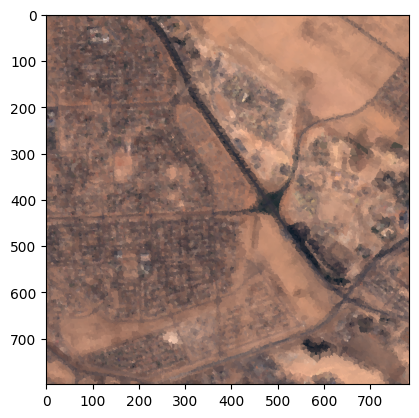

In [21]:
plt.imshow(im1)
plt.show()
plt.imsave('initial.png',im1)

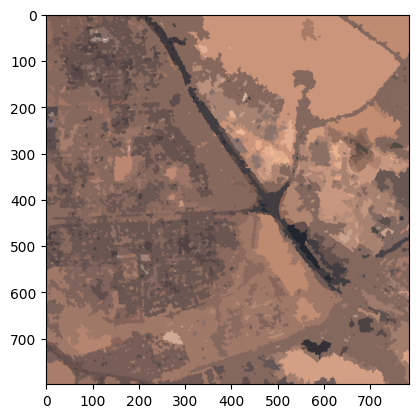

In [22]:
plt.imshow(im2)
plt.show()
plt.imsave('final.png',im2)